In [ ]:
#Fundamentals
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import random
import math

#System
import os
import glob
import time
import multiprocessing as mp

#Pytorch
import torch
import torch.optim as optim
import torch.nn as nn
import torch.nn.functional as F
from torchvision import transforms, utils
from torch.utils.data import Dataset, DataLoader

#Sklearn
from sklearn.model_selection import train_test_split

## Reading of input data

In [6]:
def create_triplets_from_case(case_path, idx):
    """
    Ideas for improvement:
    -Why do we have to double the number of slices? Couldn't we predict not 1, but more in-between?
    -Why to take just the neighbouring ones?
    -Now the triplets are (1,2,3),(4,5,6),(7,8,9)..., but could get more triplets by (1,2,3), (2,3,4), (3,4,5)...
    """
    npz=np.load(case_path)
    ct=npz[npz.files[0]]
    ct=np.moveaxis(ct,-1,0)
    ct=ct[:(len(ct)-(len(ct)%3))]
    case_triplets=np.asarray(np.split(ct,len(ct)//3))
    case_triplets=(case_triplets-np.min(case_triplets))/(np.max(case_triplets)-np.min(case_triplets))
    print(f"Case {idx} is done")
    return case_triplets
    
def create_all_triplets(parallel_jobs=mp.cpu_count(), max_cases=None):
    ct_path="/mnt/idms/PROJECTS/Lung/Tudo-Ulyssys-Unzipped"
    case_paths=list(glob.glob(f'{ct_path}/*/*.npz'))
    if max_cases:
        case_paths=case_paths[:max_cases]
    with mp.Pool(parallel_jobs) as pool: #get_context("spawn")
        triplets = pool.starmap(create_triplets_from_case, zip(case_paths,list(range(len(case_paths)))))
    pool.join() #Maybe helps
    return triplets

In [7]:
%%time
triplets=create_all_triplets(max_cases=20, parallel_jobs=20) #VEEEERY SLOW WITH MORE, 5000 DOESN'T EVEN RUN
#I COULDN'T FIND THE EXACT CAUSE, BUT IT CAN DEADLOCK WITH TOO MANY PROCESSES AND MAX_CASES

Case 10 is done
Case 8 is done
Case 9 is done
Case 11 is done
Case 13 is done
Case 17 is done
Case 12 is done
Case 14 is done
Case 6 is done
Case 2 is done
Case 15 is done
Case 4 is done
Case 18 is done
Case 19 is done
Case 3 is done
Case 5 is done
Case 7 is done
Case 16 is done
Case 1 is done
Case 0 is done
CPU times: user 36.4 s, sys: 2min 13s, total: 2min 49s
Wall time: 4min 31s


## Settings

In [8]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

In [36]:
number_of_epochs = 100
learning_rate = 0.05
batch_size=16

## Dataloaders

In [11]:
class Triplets(Dataset):
    
    def __init__(self, data, triplets_per_case=20, transform=None):
        self.data = []
        self.len=len(data)*triplets_per_case
        for case in data:
            self.data+=list(case[np.random.randint(case.shape[0], size=triplets_per_case),:,:,:])
        self.data=np.asarray(self.data)
        self.transform = transform
            
        
    def __getitem__(self, idx):
        xs=(self.data[idx,0,:,:],self.data[idx,2,:,:])
        y=self.data[idx,1,:,:]
        if self.transform:
            xs=tuple(self.transform(x) for x in xs)
            y=self.transform(y)
        return xs, y
    
    def __len__ (self):
        return self.len

In [12]:
train_transform = transforms.Compose([ #Now composition is unnecessary, but maybe more transforms will be added
    transforms.ToTensor()
])

test_transform = transforms.Compose([
    transforms.ToTensor()
])
    
train_dataset_raw, test_dataset_raw = train_test_split(triplets, test_size=0.2, shuffle=True)
    
train_dataset = Triplets(train_dataset_raw, transform=train_transform)
train_loader = DataLoader(dataset=train_dataset, batch_size=batch_size, shuffle=True)
    
test_dataset = Triplets(test_dataset_raw, transform=test_transform)
test_loader = DataLoader(dataset=test_dataset, batch_size=1, shuffle=False)

## Neural network

In [13]:
class ConvNet(nn.Module):
    def __init__(self):
        super(ConvNet, self).__init__()
        self.conv1 = nn.Conv2d(1, 64, 9, padding = 4)
        self.conv2 = nn.Conv2d(64, 32, 1, padding = 0)
        self.conv3 = nn.Conv2d(32, 32, 5, padding = 2)
        self.conv4 = nn.Conv2d(32, 1, 1, padding = 0)
        
    def forward(self, x1, x3):
        x1 = F.selu(self.conv1(x1))
        x1 = F.selu(self.conv2(x1))
        x1 = F.selu(self.conv3(x1))
        x3 = F.selu(self.conv1(x3))
        x3 = F.selu(self.conv2(x3))
        x3 = F.selu(self.conv3(x3))
        out = torch.cat((x1, x3), dim=1)
        out = F.selu(self.conv2(out))
        out = F.selu(self.conv3(out))
        out = F.selu(self.conv4(out))
        return out

## Training

In [38]:
def train_step(model,device,optimizer,criterion,train_loader, log_freq=5):
    
    for batch_idx, (xs, ys) in enumerate(train_loader):
        xs=[x.to(device, dtype=torch.float) for x in xs]
        ys=ys.to(device, dtype=torch.float)
        outputs = model(xs[0],xs[1])
        loss = criterion(outputs, ys)
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        if batch_idx % log_freq == 0:
            print(f"Batch {batch_idx+1} / {len(train_loader)} | Loss = {loss.item()}")

In [39]:
def evaluate(model,device=device,criterion=nn.SmoothL1Loss(),test_loader=test_loader, plot_result=False):
    total_loss=0
    with torch.no_grad():
        for batch_idx, (xs, ys) in enumerate(test_loader):
            xs=[x.to(device, dtype=torch.float) for x in xs]
            ys=ys.to(device, dtype=torch.float)
            pred_tensor = model(xs[0],xs[1])
            loss = criterion(pred_tensor, ys)
            total_loss+=loss.item()
            
            if plot_result:
                
                pred_np=pred_tensor[0,0,:,:].cpu().detach().numpy()
                x1_np=xs[0][0,0,:,:].cpu().detach().numpy()
                x3_np=xs[1][0,0,:,:].cpu().detach().numpy()
                y_np=ys[0,0,:,:].cpu().detach().numpy()
                
                fig, (ax1, ax2, ax3, ax4) = plt.subplots(1, 4, figsize=(32,8))
                ax1.set_title("Previous")
                ax2.set_title("Predicted middle")
                ax3.set_title("Correct middle")
                ax4.set_title("Next")
                
                ax1.imshow(x1_np,cmap=plt.cm.Greys_r)
                ax2.imshow(pred_np,cmap=plt.cm.Greys_r)
                ax3.imshow(y_np,cmap=plt.cm.Greys_r)
                ax4.imshow(x3_np,cmap=plt.cm.Greys_r)
                plt.show()
                
    avg_loss=total_loss/len(test_loader)
    print(f"The average test loss is {avg_loss}.")
    return avg_loss

In [ ]:
def train_convnet(model = ConvNet(), criterion = nn.SmoothL1Loss(), optimizer = optim.SGD,
                  learning_rate=learning_rate, number_of_epochs=number_of_epochs,
                  train_loader=train_loader, test_loader=test_loader,
                  device=device, plot_loss=True):
    
    model=model.to(device)
    optimizer=optimizer(model.parameters(),lr=learning_rate)
    
    best_sofar=None
    test_losses=[]
    
    print("Training has started.")
    for epoch in range(number_of_epochs):
        print(f"EPOCH {epoch} HAS STARTED.")
        train_step(model,device,optimizer,criterion,train_loader)
        test_loss=evaluate(model,device,criterion,test_loader)
        test_losses.append(test_loss)
        if not best_sofar or test_loss<best_sofar:
            best_sofar=test_loss
            print(f"BEST TEST LOSS SO FAR HAS IMPROVED TO {test_loss}!")
    
    if plot_loss:
        plt.figure()
        plt.title("Test losses")
        plt.plot(test_losses)
        plt.show()
    print("Training has finished.")
    return model

Training has started.
EPOCH 0 HAS STARTED.
Batch 1 / 20 | Loss = 0.12306851148605347
Batch 6 / 20 | Loss = 0.0076121133752167225
Batch 11 / 20 | Loss = 0.004197247792035341
Batch 16 / 20 | Loss = 0.002411983208730817
The average test loss is 0.0010993975534802302.
BEST TEST LOSS SO FAR HAS IMPROVED TO 0.0010993975534802302!
EPOCH 1 HAS STARTED.
Batch 1 / 20 | Loss = 0.0016563509125262499
Batch 6 / 20 | Loss = 0.0017336395103484392
Batch 11 / 20 | Loss = 0.001197171863168478
Batch 16 / 20 | Loss = 0.0012069533113390207
The average test loss is 0.0008987213725049515.
BEST TEST LOSS SO FAR HAS IMPROVED TO 0.0008987213725049515!
EPOCH 2 HAS STARTED.
Batch 1 / 20 | Loss = 0.0008727703243494034
Batch 6 / 20 | Loss = 0.0015393844805657864
Batch 11 / 20 | Loss = 0.0012039411813020706
Batch 16 / 20 | Loss = 0.0013433477142825723
The average test loss is 0.0008829023361613508.
BEST TEST LOSS SO FAR HAS IMPROVED TO 0.0008829023361613508!
EPOCH 3 HAS STARTED.
Batch 1 / 20 | Loss = 0.00120746670290

Batch 11 / 20 | Loss = 0.0007265872554853559
Batch 16 / 20 | Loss = 0.0005066808662377298
The average test loss is 0.0004020861071694526.
BEST TEST LOSS SO FAR HAS IMPROVED TO 0.0004020861071694526!
EPOCH 30 HAS STARTED.
Batch 1 / 20 | Loss = 0.0005412283935584128
Batch 6 / 20 | Loss = 0.0006043786997906864
Batch 11 / 20 | Loss = 0.0003735937352757901
Batch 16 / 20 | Loss = 0.0004974569892510772
The average test loss is 0.0003955796084483154.
BEST TEST LOSS SO FAR HAS IMPROVED TO 0.0003955796084483154!
EPOCH 31 HAS STARTED.
Batch 1 / 20 | Loss = 0.00043760970584116876
Batch 6 / 20 | Loss = 0.0006329884054139256
Batch 11 / 20 | Loss = 0.0006314048659987748
Batch 16 / 20 | Loss = 0.0009039230062626302
The average test loss is 0.00043490882890182545.
EPOCH 32 HAS STARTED.
Batch 1 / 20 | Loss = 0.0004613004857674241
Batch 6 / 20 | Loss = 0.0009385765297338367
Batch 11 / 20 | Loss = 0.0006485836347565055
Batch 16 / 20 | Loss = 0.00044199483818374574
The average test loss is 0.00051139918723

Batch 16 / 20 | Loss = 0.0004514837055467069
The average test loss is 0.0004117537035199348.


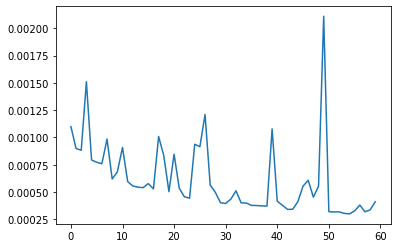

Training has finished.


In [42]:
trained_model=train_convnet(number_of_epochs=60)

## Saving the model

In [43]:
model_number=1
while os.path.exists(f"/mnt/idms/home/andor/superres/models/{model_number}.pth"):
    model_number+=1
torch.save(trained_model, f"/mnt/idms/home/andor/superres/models/{model_number}.pth")

## Testing

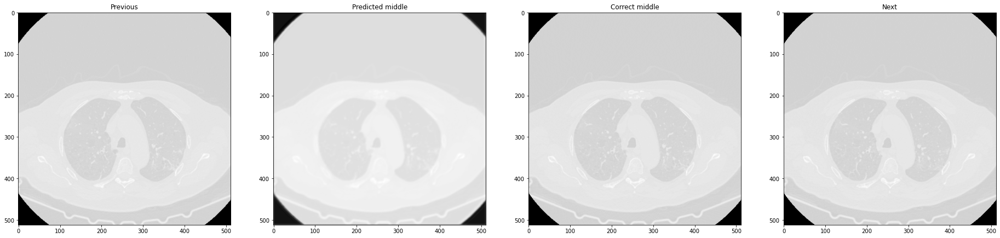

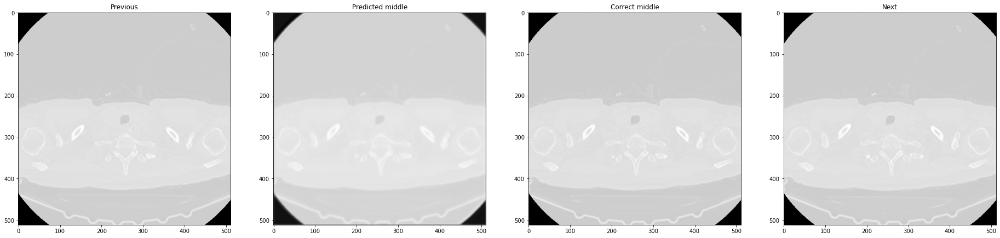

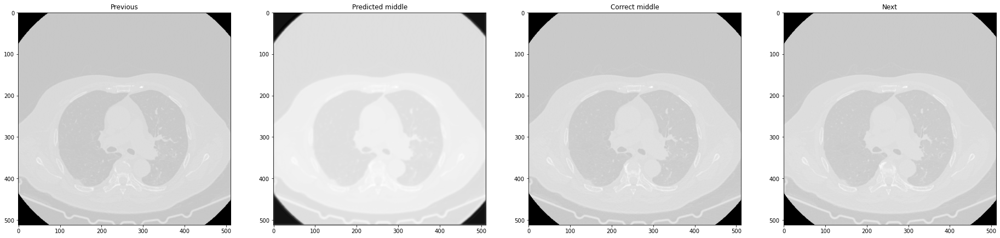

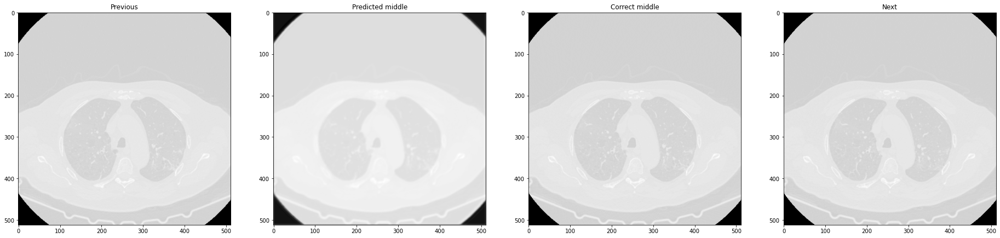

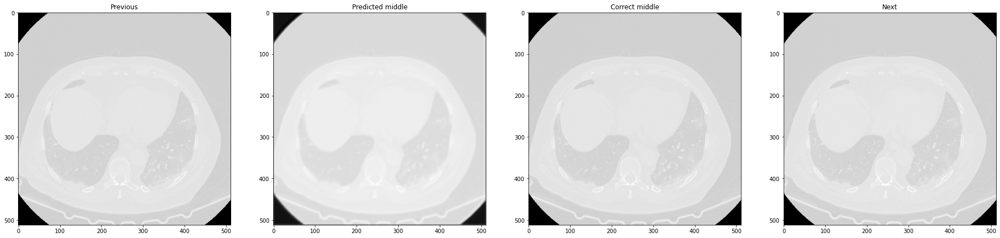

...

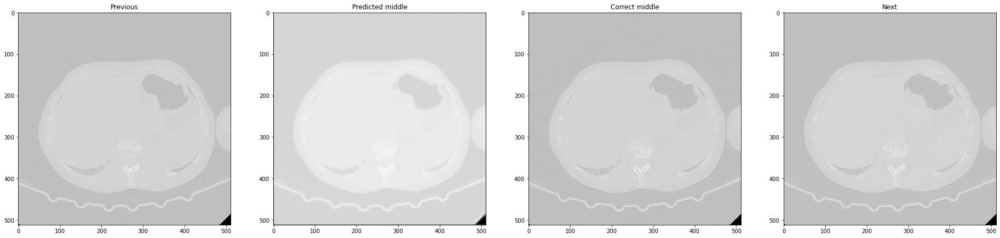

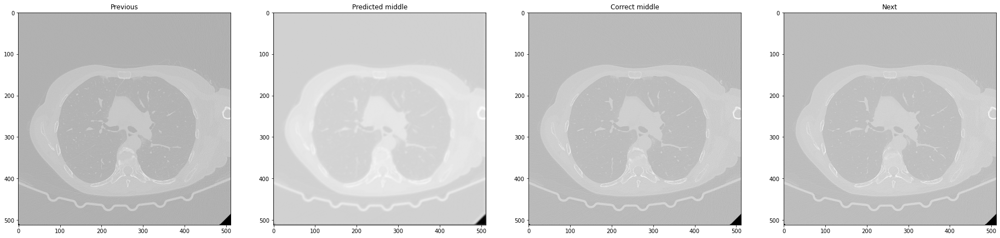

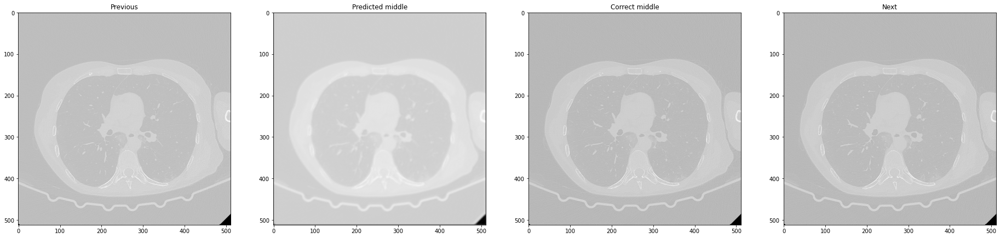

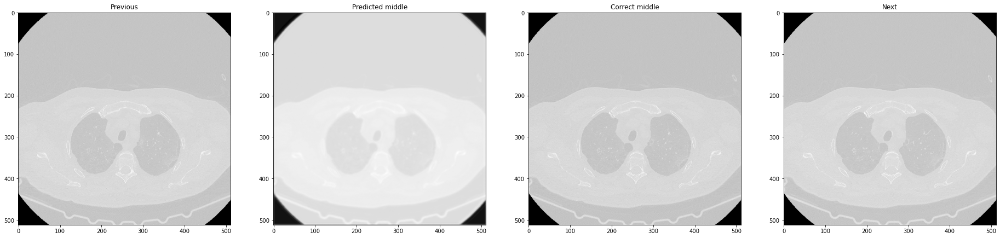

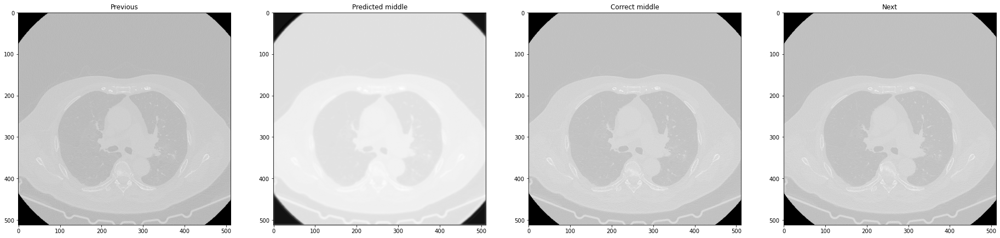

In [ ]:
evaluate(trained_model,plot_result=True)